In [21]:
suppressPackageStartupMessages({
  library(Seurat)
  library(dplyr)
  library(ggplot2)
  library(scCustomize)
  library(scater)
    library(RColorBrewer)
    library(data.table)
    library(stringr)
library(tibble)
    library(tidyr)
})

In [22]:
fig.size <- function (height, width, res=300) {
    options(repr.plot.height = height, repr.plot.width = width, resolution=res)
}

In [8]:
furlan_list = openxlsx::read.xlsx(
    '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/notebook/With_Ribosom/spread_sheet/Figure2A_20230629_Furlan2017_signature.xlsx')

Hanemaa_list = openxlsx::read.xlsx(
    '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/notebook/With_Ribosom/spread_sheet/Figure2A_20230629_Hanemaaijer2021_Signature.xlsx')

kameneva_list = openxlsx::read.xlsx('Figure2A_20240807_Kameneva2021_signature.xlsx')


In [3]:
homo = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_homo.rds'
        )
)

In [4]:
hemi = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.rds'
        )
)

## Write down count files 

In [24]:
homo$orig.ident %>% unique

[1] "homo1"    "homo2"    "homo3"    "no_6_PT"  "no_50_PT"

In [25]:
subset(homo, orig.ident == 'homo1')

An object of class Seurat 
33411 features across 6860 samples within 2 assays 
Active assay: RNA (31411 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [28]:
# Get the unique identities or clusters
idents <- unique(homo$orig.ident)

# Loop through each identity (cluster) and extract counts
for (ident in idents) {
  # Subset the Seurat object by identity
  subset_obj <- subset(homo, orig.ident == ident)
  
  # Extract counts layer
  counts_matrix <- GetAssayData(subset_obj, slot = "counts")
  
  # Convert to data frame for easier export
  counts_df <- as.data.frame(as.matrix(counts_matrix))
  
  # Create a file name based on the identity
  output_file <- paste0("count_csvs/", paste0(ident, "_counts.csv"))
  
  # Write to CSV
  write.csv(counts_df, output_file)
  
  cat("CSV for", ident, "written to", output_file, "\n")
}

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.6 GiB”


In [32]:
lapply(hemi$orig.ident %>% unique, function(ident){
    subset(hemi, orig.ident == ident) %>% dim
})

[[1]]
[1] 31411 12856

[[2]]
[1] 31411  6833

[[3]]
[1] 31411 12546

[[4]]
[1] 31411 13317

[[5]]
[1] 31411 12316

In [33]:
hemi

An object of class Seurat 
33411 features across 57868 samples within 2 assays 
Active assay: RNA (31411 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [31]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Red Hat Enterprise Linux 8.10 (Ootpa)

Matrix products: default
BLAS/LAPACK: /scratch/gpfs/KANG/hirak/mambaforge/envs/r43/lib/libopenblasp-r0.3.23.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] TSCAN_1.38.0                slingshot_2.8.0            
 [3] TrajectoryUtils_1.8.0       princurve_2.1.6            
 [5] ggbreak_0.1.2               tidyr_1.3.1             

### Furlan 

In [10]:
gene_sets <- split(furlan_list$Gene, furlan_list$Annotation)

In [37]:
homo = AddModuleScore(
        object = homo,
        features = gene_sets,
    name = paste0('Furlan_',names(gene_sets))
    )
hemi = AddModuleScore(
        object = hemi,
        features = gene_sets,
    name = paste0('Furlan_',names(gene_sets))
    )

### Hanema

In [38]:
gene_sets <- split( Hanemaa_list$Gene, Hanemaa_list$Annotation)

In [39]:
homo = AddModuleScore(
        object = homo,
        features = gene_sets,
    name = paste0('Hanema_',names(gene_sets))
    )
hemi = AddModuleScore(
        object = hemi,
        features = gene_sets,
    name = paste0('Hanema_',names(gene_sets))
    )

Warning message:
“The following features are not present in the object: 2900027M19Rik, Rian, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: 2900027M19Rik, Rian, not searching for symbol synonyms”


## Kamenova

In [40]:
gene_sets <- split( kameneva_list$Gene, kameneva_list$Annotation)

In [41]:
homo = AddModuleScore(
        object = homo,
        features = gene_sets,
    name = paste0('Kamenova_',names(gene_sets))
    )
hemi = AddModuleScore(
        object = hemi,
        features = gene_sets,
    name = paste0('Kamenova_',names(gene_sets))
    )

## Plot the signatures

In [217]:
homo@meta.data %>% colnames

[1] "orig.ident"                    "nCount_RNA"                   
 [3] "nFeature_RNA"                  "percent.mt"                   
 [5] "integrated_snn_res.0.5"        "seurat_clusters"              
 [7] "integrated_snn_res.0.3"        "annot"                        
 [9] "adrn_score1"                   "UMAP_1"                       
[11] "UMAP_2"                        "annot.rename"                 
[13] "S.Score"                       "G2M.Score"                    
[15] "Phase"                         "old.ident"                    
[17] "Furlan_Bridge1"                "Furlan_Chromaffin2"           
[19] "Furlan_SCP3"                   "Furlan_Sympathoblasts4"       
[21] "Hanema_Bridge1"                "Hanema_Committed Progenitors2"
[23] "Hanema_E chromaffin3"          "Hanema_N chromaffin4"         
[25] "Hanema_Neuroblast5"            "Hanema_Pre−E Chromaffin6"     
[27] "Hanema_SCP7"                   "Kamenova_Bridge1"             
[29] "Kamenova_Chromaffin2"          "Kamenova_SCP3"                
[31] "Kamenova_Sympathoblasts4"      "Cluster1"                     
[33] "Cluster2"                      "Cluster3"                     
[35] "Cluster4"

In [218]:
signature_columns <- c('Furlan_Bridge1', 'Furlan_Chromaffin2', 'Furlan_SCP3', 'Furlan_Sympathoblasts4',
                       'Hanema_Bridge1', 'Hanema_Committed Progenitors2', 'Hanema_E chromaffin3',
                       'Hanema_N chromaffin4', 'Hanema_Neuroblast5', 'Hanema_Pre−E Chromaffin6',
                       'Hanema_SCP7', 'Kamenova_Bridge1', 'Kamenova_Chromaffin2', 'Kamenova_SCP3', 
                       'Kamenova_Sympathoblasts4')

# Fetch the data from the Seurat object
signature_scores <- FetchData(homo, vars = signature_columns)

In [219]:
signature_scores %>% head

,Furlan_Bridge1,Furlan_Chromaffin2,Furlan_SCP3,Furlan_Sympathoblasts4,Hanema_Bridge1,Hanema_Committed Progenitors2,Hanema_E chromaffin3,Hanema_N chromaffin4,Hanema_Neuroblast5,Hanema_Pre−E Chromaffin6,Hanema_SCP7,Kamenova_Bridge1,Kamenova_Chromaffin2,Kamenova_SCP3,Kamenova_Sympathoblasts4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
homo1_tumor_AAACCCAAGAGGATCC-1,-0.08268840,-0.2782489,-0.021502058,-0.3178270,-0.179868762,-0.38391031,-0.2926335,-0.09991166,-0.5202272,-0.1011054072,-0.02231653,-0.06704845,-0.4699968,-0.02341221,-0.3868036
homo1_tumor_AAACCCAAGCATGATA-1,-0.06819029,1.2396997,-0.014766430,-0.2458230,0.202792781,0.60841668,0.5331830,0.43034709,0.6242155,-0.0822779433,-0.02068496,-0.10537652,1.2428867,-0.01816878,0.1960195
homo1_tumor_AAACCCAAGTTCCGGC-1,-0.01304952,-0.4837076,-0.022988271,-0.2774170,-0.177175733,-0.36950245,-0.2651748,0.03517758,-0.3373087,-0.0474180902,-0.03975668,0.15369656,-0.4531836,0.40922483,-0.1904157
homo1_tumor_AAACCCACAGTCCGTG-1,0.08387740,0.2714324,-0.007753233,0.2407433,0.095704415,-0.01516941,0.3343052,0.21704884,0.6773605,0.0001532096,-0.01171560,0.01021043,0.6103855,-0.01299439,0.3448457
homo1_tumor_AAACCCACATCAGCAT-1,0.06986615,0.3265669,-0.011547405,-0.0822910,0.004241075,0.16920898,0.1573874,-0.01261780,0.2701862,-0.0194600969,-0.01513135,0.04576686,0.3583013,-0.01535984,-0.1492447
homo1_tumor_AAACCCAGTTTCGATG-1,0.02129029,0.2382394,-0.009311724,0.1805297,0.175846308,0.21963179,0.1204275,0.05662719,0.8733587,-0.0274765955,-0.01667008,0.15598209,0.4268888,-0.01852495,0.4166066


In [220]:
umap_info = Embeddings(homo,reduction = 'umap') %>% data.frame

In [221]:
signature_scores = merge(signature_scores, umap_info, by = 'row.names')

In [222]:
signature_scores %>% colnames

[1] "Row.names"                     "Furlan_Bridge1"               
 [3] "Furlan_Chromaffin2"            "Furlan_SCP3"                  
 [5] "Furlan_Sympathoblasts4"        "Hanema_Bridge1"               
 [7] "Hanema_Committed Progenitors2" "Hanema_E chromaffin3"         
 [9] "Hanema_N chromaffin4"          "Hanema_Neuroblast5"           
[11] "Hanema_Pre−E Chromaffin6"      "Hanema_SCP7"                  
[13] "Kamenova_Bridge1"              "Kamenova_Chromaffin2"         
[15] "Kamenova_SCP3"                 "Kamenova_Sympathoblasts4"     
[17] "umap_1"                        "umap_2"

In [223]:
colnames(signature_scores) <- gsub(" ", "_", colnames(signature_scores))


In [224]:
colnames(signature_scores) <- gsub("−", "_", colnames(signature_scores))

In [225]:
signature_columns = gsub(" ", "_", signature_columns)

In [226]:
signature_columns = gsub("−", "_", signature_columns)

In [227]:
signature_columns

[1] "Furlan_Bridge1"                "Furlan_Chromaffin2"           
 [3] "Furlan_SCP3"                   "Furlan_Sympathoblasts4"       
 [5] "Hanema_Bridge1"                "Hanema_Committed_Progenitors2"
 [7] "Hanema_E_chromaffin3"          "Hanema_N_chromaffin4"         
 [9] "Hanema_Neuroblast5"            "Hanema_Pre_E_Chromaffin6"     
[11] "Hanema_SCP7"                   "Kamenova_Bridge1"             
[13] "Kamenova_Chromaffin2"          "Kamenova_SCP3"                
[15] "Kamenova_Sympathoblasts4"

In [228]:
library(viridis)

Loading required package: viridisLite



In [86]:
plotlist = list()
for (i in signature_columns){
   plotlist[[i]] = signature_scores %>% ggplot(aes(x=umap_1,y=umap_2)) + 
    geom_point(size=1,alpha = 1.0,aes_string(color = i)) +
    theme_classic() +
    #ggtitle(i) +
    scale_color_gradient(low = "white", high = "darkred") +
    theme_void() +
    theme(legend.title = element_blank())
}

In [87]:
length(plotlist)

[1] 15

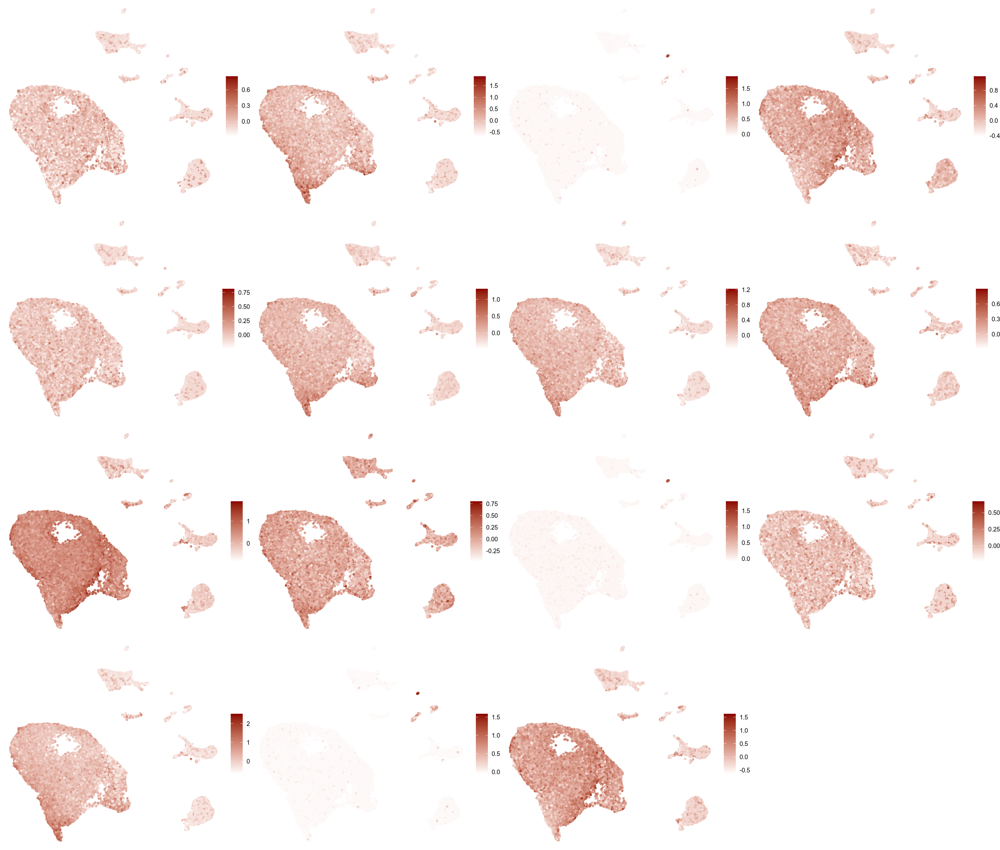

In [89]:
options(repr.plot.height=17, repr.plot.width=20, res=150 )
gridExtra::grid.arrange(grobs = plotlist, ncol=4)

In [242]:
plotlist = list()
for (i in signature_columns){
   plotlist[[i]] = signature_scores %>% ggplot(aes(x=umap_1,y=umap_2)) + 
    geom_point(size=0.5,alpha = 0.8,aes_string(color = i)) +
    theme_classic() +
    #ggtitle(i) +
    #scale_color_gradient(low = "white", high = "darkred") +
    scale_color_viridis_c(option = "magma", direction = -1,limits = c(-1, 1)) +
    theme_void() +
    theme(legend.title = element_blank())
}


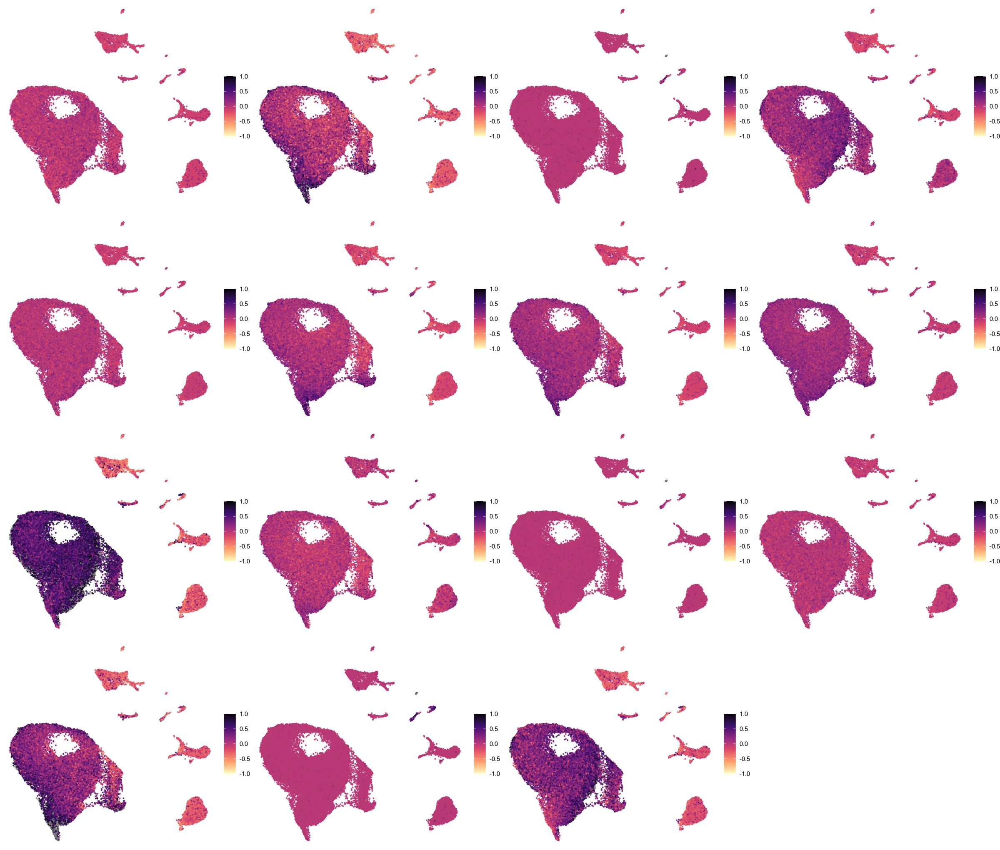

In [243]:
options(repr.plot.height=17, repr.plot.width=20, res=150 )
gridExtra::grid.arrange(grobs = plotlist, ncol=4)

In [91]:
g = gridExtra::arrangeGrob(grobs = plotlist, ncol=4)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Figure2A-Homozygous_outside_plot.pdf'),
    plot =g, 
    height = 20,
    width = 17,
    create.dir=TRUE
      )

In [92]:
hemi@meta.data %>% colnames

[1] "orig.ident"                    "nCount_RNA"                   
 [3] "nFeature_RNA"                  "percent.mt"                   
 [5] "integrated_snn_res.0.5"        "seurat_clusters"              
 [7] "integrated_snn_res.0.3"        "annot"                        
 [9] "adrn_score1"                   "UMAP_1"                       
[11] "UMAP_2"                        "annot.rename"                 
[13] "scDblFinder.class"             "scDblFinder.score"            
[15] "Furlan_Bridge1"                "Furlan_Chromaffin2"           
[17] "Furlan_SCP3"                   "Furlan_Sympathoblasts4"       
[19] "Hanema_Bridge1"                "Hanema_Committed Progenitors2"
[21] "Hanema_E chromaffin3"          "Hanema_N chromaffin4"         
[23] "Hanema_Neuroblast5"            "Hanema_Pre−E Chromaffin6"     
[25] "Hanema_SCP7"                   "Kamenova_Bridge1"             
[27] "Kamenova_Chromaffin2"          "Kamenova_SCP3"                
[29] "Kamenova_Sympathoblasts4"

In [100]:
signature_columns <- c('Furlan_Bridge1', 'Furlan_Chromaffin2', 'Furlan_SCP3', 'Furlan_Sympathoblasts4',
                       'Hanema_Bridge1', 'Hanema_Committed Progenitors2', 'Hanema_E chromaffin3',
                       'Hanema_N chromaffin4', 'Hanema_Neuroblast5', 'Hanema_Pre−E Chromaffin6',
                       'Hanema_SCP7', 'Kamenova_Bridge1', 'Kamenova_Chromaffin2', 'Kamenova_SCP3', 
                       'Kamenova_Sympathoblasts4')

In [102]:
signature_scores <- FetchData(hemi, vars = signature_columns)
umap_info = Embeddings(hemi,reduction = 'umap') %>% data.frame

In [103]:
signature_scores = merge(signature_scores, umap_info, by = 'row.names')

In [104]:
colnames(signature_scores) <- gsub(" ", "_", colnames(signature_scores))
colnames(signature_scores) <- gsub("−", "_", colnames(signature_scores))
signature_columns = gsub(" ", "_", signature_columns)
signature_columns = gsub("−", "_", signature_columns)

In [105]:
plotlist = list()
for (i in signature_columns){
   plotlist[[i]] = signature_scores %>% ggplot(aes(x=umap_1,y=umap_2)) + 
    geom_point(size=1,alpha = 1.0,aes_string(color = i)) +
    theme_classic() +
    #ggtitle(i) +
    scale_color_gradient(low = "white", high = "darkred") +
    theme_void() +
    theme(legend.title = element_blank())
}

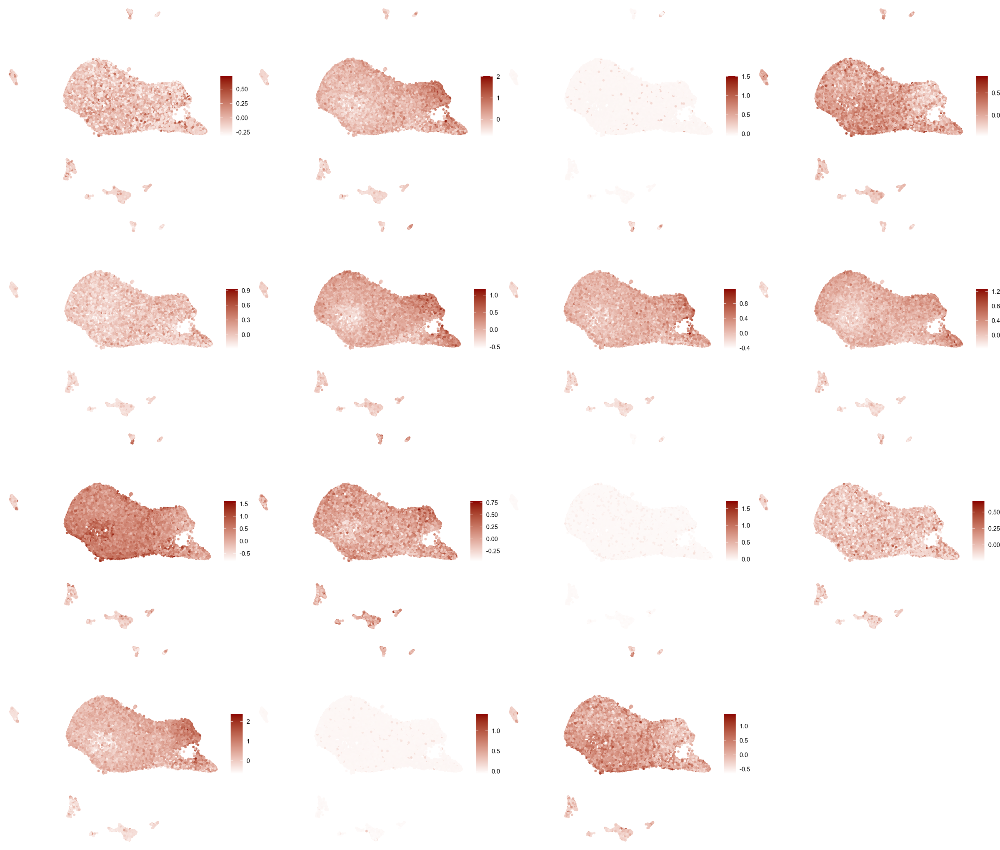

In [106]:
options(repr.plot.height=17, repr.plot.width=20, res=150 )
gridExtra::grid.arrange(grobs = plotlist, ncol=4)

In [107]:
g = gridExtra::arrangeGrob(grobs = plotlist, ncol=4)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_2/Figure2A-Hemizygous_outside_plot.pdf'),
    plot =g, 
    height = 20,
    width = 17,
    create.dir=TRUE
      )

### Signature plot from Organoid

In [121]:
organoid_sig = c('Dhx36','Nsd1','Ktn1',
'Tbca','Pgk1','Fdps','Sod1','Fbxo5','Ccne1',
'Baiap2','Ddit4','Cdkn1a','Ass1')

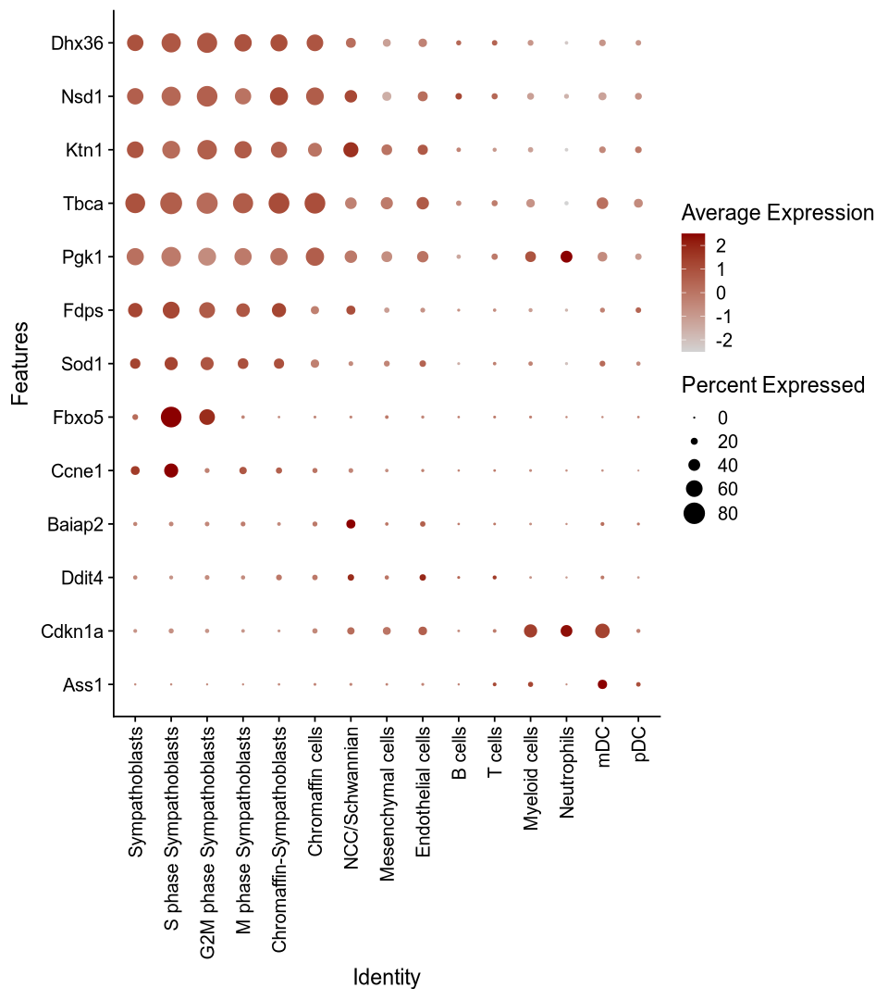

In [122]:

fig.size(9,8)
phomo = DotPlot(
        homo, 
        assay='RNA',
        features = organoid_sig %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1,vjust=0.5))
phomo

In [259]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/FigureR1E-Homozygous_organoid_dot_plot.pdf'),
    plot =phomo, 
    height = 9,
    width = 8,
    create.dir=TRUE
      )

### Other signatures UMAP

In [125]:
umap_list = list(
C1=c('Dhx36','Nsd1','Ktn1','Tsix'),
C2=c('Tbca','Pgk1','Fdps','Sod1'), 
C3=c('Fbxo5','Ccne1','Baiap2','Ddit4','Cdkn1a'),
C4=c('Ass1','Nos1','Crabp1','Hmx3')
)

In [127]:
homo = AddModuleScore(
    homo,
    features = umap_list,
    names = names(umap_list)
)

In [129]:
homo@meta.data %>% colnames

[1] "orig.ident"                    "nCount_RNA"                   
 [3] "nFeature_RNA"                  "percent.mt"                   
 [5] "integrated_snn_res.0.5"        "seurat_clusters"              
 [7] "integrated_snn_res.0.3"        "annot"                        
 [9] "adrn_score1"                   "UMAP_1"                       
[11] "UMAP_2"                        "annot.rename"                 
[13] "S.Score"                       "G2M.Score"                    
[15] "Phase"                         "old.ident"                    
[17] "Furlan_Bridge1"                "Furlan_Chromaffin2"           
[19] "Furlan_SCP3"                   "Furlan_Sympathoblasts4"       
[21] "Hanema_Bridge1"                "Hanema_Committed Progenitors2"
[23] "Hanema_E chromaffin3"          "Hanema_N chromaffin4"         
[25] "Hanema_Neuroblast5"            "Hanema_Pre−E Chromaffin6"     
[27] "Hanema_SCP7"                   "Kamenova_Bridge1"             
[29] "Kamenova_Chromaffin2"          "Kamenova_SCP3"                
[31] "Kamenova_Sympathoblasts4"      "Cluster1"                     
[33] "Cluster2"                      "Cluster3"                     
[35] "Cluster4"

In [130]:
cnames = c('Cluster1','Cluster2','Cluster3','Cluster4')

In [132]:
signature_scores <- FetchData(homo, vars = cnames)

In [133]:
umap_info = Embeddings(homo,reduction = 'umap') %>% data.frame

In [134]:
signature_scores = merge(signature_scores, umap_info, by = 'row.names')

In [137]:
plotlist = list()
for (i in cnames){
   plotlist[[i]] = signature_scores %>% ggplot(aes(x=umap_1,y=umap_2)) + 
    geom_point(size=0.1,alpha = 1.0,aes_string(color = i)) +
    theme_classic() +
    #ggtitle(i) +
    scale_color_gradient(low = "white", high = "darkred") +
    theme_void() +
    theme(legend.title = element_blank())
}

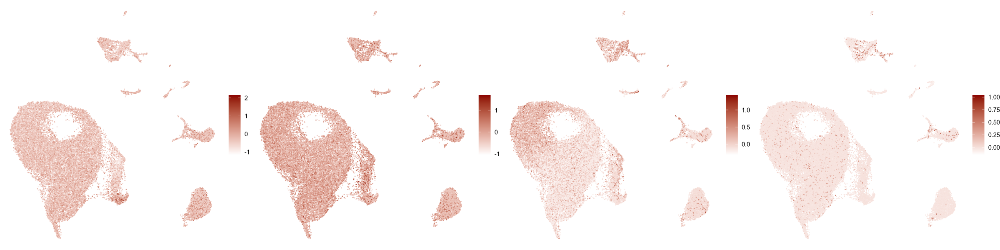

In [138]:
options(repr.plot.height=5, repr.plot.width=20, res=150 )
gridExtra::grid.arrange(grobs = plotlist, ncol=4)

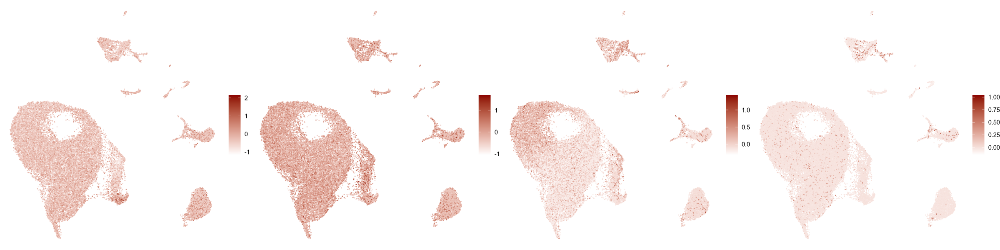

In [139]:
g = gridExtra::grid.arrange(grobs = plotlist, ncol=4)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/FigureR1F-Homozygous_organoid_umap.pdf'),
    plot =g, 
    height = 5,
    width = 20,
    create.dir=TRUE
      )

In [142]:
chr = c(
    'Chromaffin-Sympathoblasts',
    'Chromaffin cells'
)

In [141]:
homo$annot %>% 

[1] "Sympathoblasts"            "S phase Sympathoblasts"   
 [3] "G2M phase Sympathoblasts"  "M phase Sympathoblasts"   
 [5] "Chromaffin-Sympathoblasts" "Chromaffin cells"         
 [7] "NCC/Schwannian"            "Mesenchymal cells"        
 [9] "Endothelial cells"         "B cells"                  
[11] "T cells"                   "Myeloid cells"            
[13] "Neutrophils"               "mDC"                      
[15] "pDC"

In [144]:
homo_subset = subset(
    homo, 
    subset = annot %in% chr
)

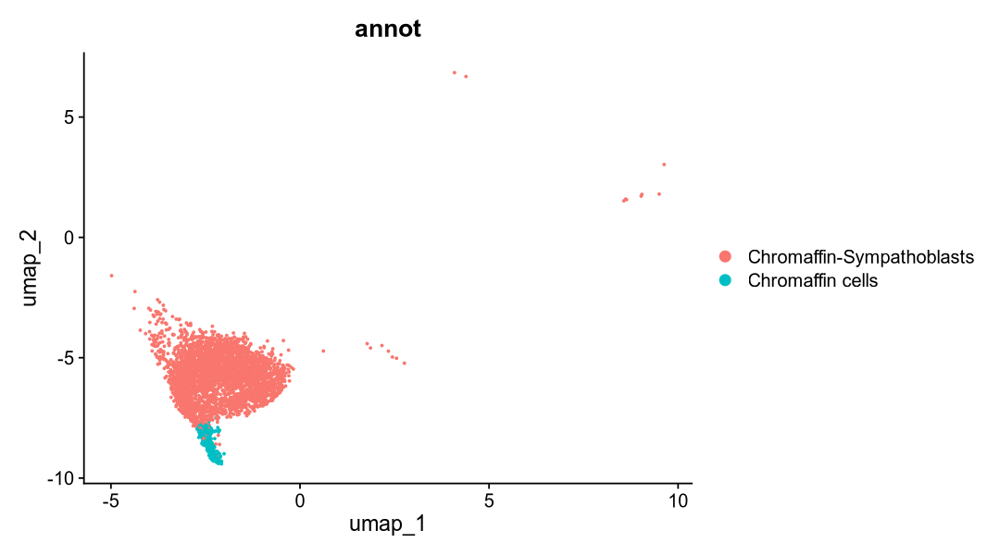

In [148]:
fig.size(5,9)
DimPlot(homo_subset, group.by='annot')

In [152]:
homo_subset = homo_subset[,Embeddings(homo_subset, reduction = 'umap') %>% data.frame %>%
    filter((umap_1 < 5) & (umap_2 < 0)) %>% rownames]

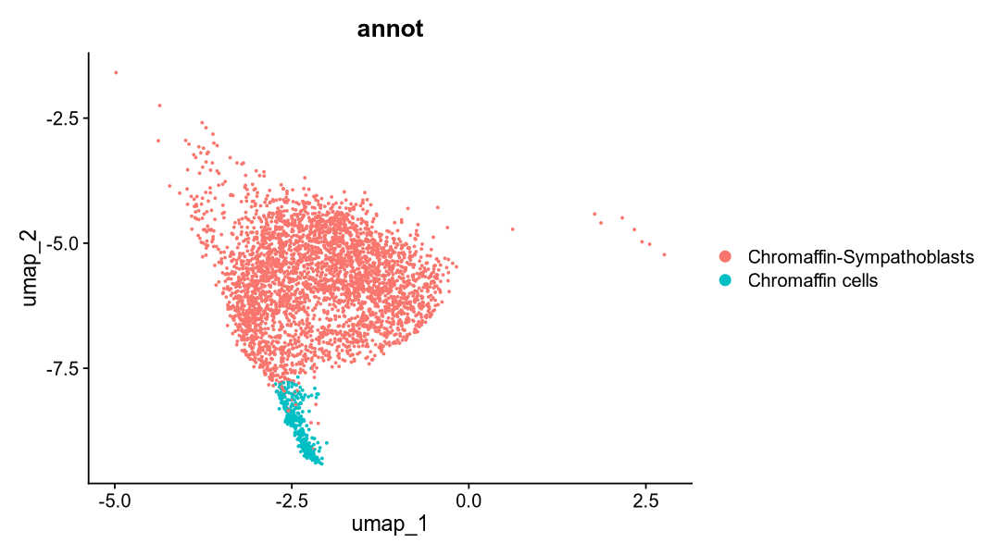

In [215]:
fig.size(5,9)

homodim = DimPlot(homo_subset, group.by='annot')
homodim
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/FigureR1C-Homozygous_subset_umap.pdf'),
    plot =homodim, 
    height = 5,
    width = 7,
    create.dir=TRUE
      )

In [166]:
seurat_subset = homo_subset

In [168]:
DefaultAssay(seurat_subset) = 'integrated'

In [169]:
# seurat_subset <- NormalizeData(seurat_subset)
# seurat_subset <- FindVariableFeatures(seurat_subset, selection.method = "vst", nfeatures = 2000)
# seurat_subset <- ScaleData(seurat_subset)
# seurat_subset <- RunPCA(seurat_subset, npcs = 30, verbose = FALSE)
seurat_subset <- FindNeighbors(seurat_subset, dims = 1:10)

Computing nearest neighbor graph

Computing SNN



In [170]:
seurat_subset = FindClusters(seurat_subset, resolution=0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3758
Number of edges: 129332

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8716
Number of communities: 4
Elapsed time: 0 seconds


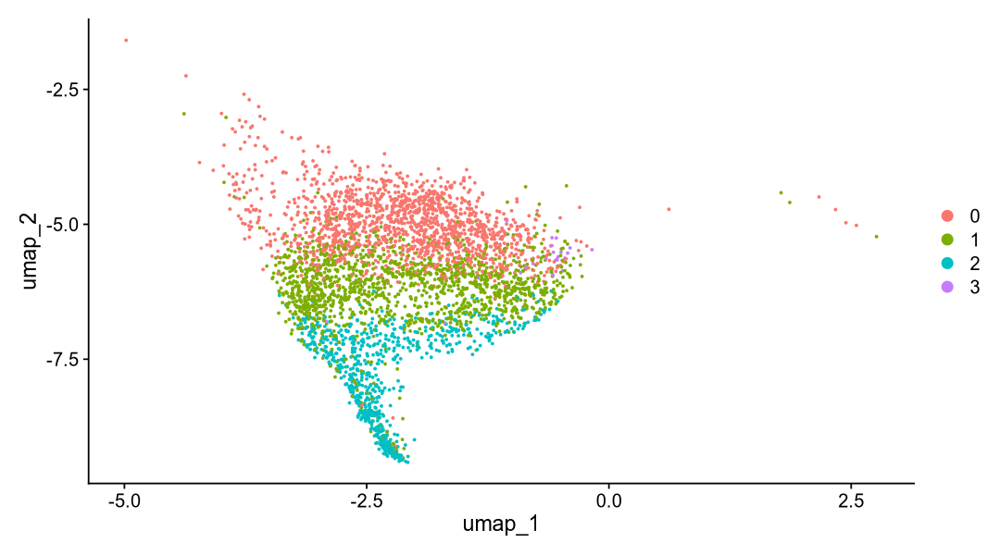

In [171]:
fig.size(5,9)
DimPlot(seurat_subset, reduction = 'umap')

In [19]:
library(slingshot)
library(TSCAN)
library(scater)

Loading required package: princurve

Loading required package: TrajectoryUtils



In [20]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Red Hat Enterprise Linux 8.10 (Ootpa)

Matrix products: default
BLAS/LAPACK: /scratch/gpfs/KANG/hirak/mambaforge/envs/r43/lib/libopenblasp-r0.3.23.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] TSCAN_1.38.0                slingshot_2.8.0            
 [3] TrajectoryUtils_1.8.0       princurve_2.1.6            
 [5] ggbreak_0.1.2               tidyr_1.3.1             

In [173]:
just.sym.sce <- as.SingleCellExperiment(seurat_subset, assay = "RNA")

In [174]:
colLabels(just.sym.sce) = factor(seurat_subset$seurat_clusters)
by.cluster <- aggregateAcrossCells(just.sym.sce, ids=colLabels(just.sym.sce))
centroids <- reducedDim(by.cluster, "PCA")

In [175]:
mst <- createClusterMST(centroids, clusters=NULL)
mst

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



IGRAPH 6c45ed6 UNW- 4 3 -- 
+ attr: name (v/c), coordinates (v/x), weight (e/n), gain (e/n)
+ edges from 6c45ed6 (vertex names):
[1] 0--1 0--3 1--2

In [176]:
line.data <- reportEdges(by.cluster, mst=mst, clusters=NULL, use.dimred="UMAP")

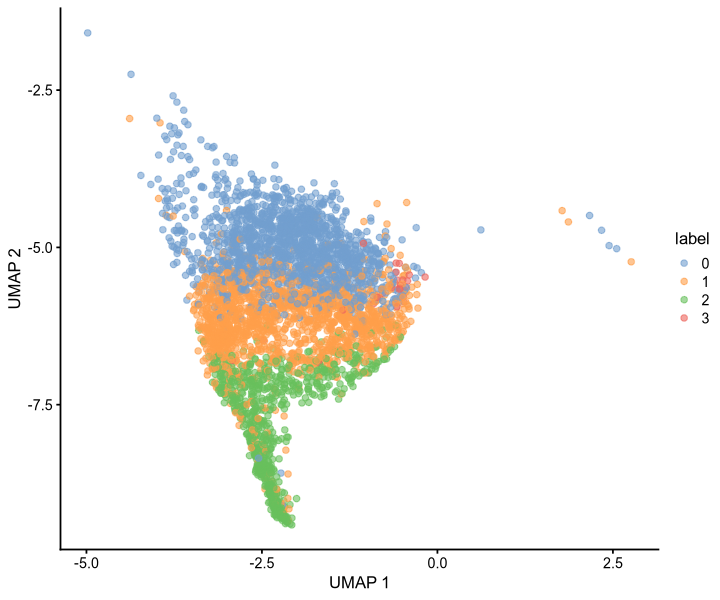

In [177]:
fig.size(5,6)
plotUMAP(just.sym.sce, colour_by="label")

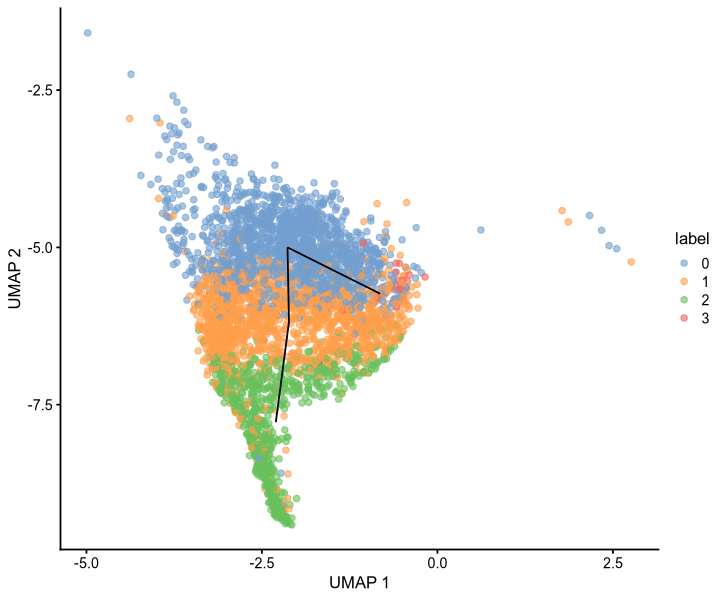

In [179]:
plotUMAP(just.sym.sce, colour_by="label") + 
    geom_line(data=line.data, mapping=aes(x=umap_1, y=umap_2, group=edge))

In [180]:
map.tscan <- mapCellsToEdges(just.sym.sce, mst=mst, use.dimred="PCA")
tscan.pseudo <- orderCells(map.tscan, mst)
head(tscan.pseudo)

class: PseudotimeOrdering 
dim: 6 1 
metadata(1): start
pathStats(1): ''
cellnames(6): homo1_tumor_AAACCCAAGCATGATA-1
  homo1_tumor_AAACGAACACAAATAG-1 ... homo1_tumor_AAAGGATGTACCGGCT-1
  homo1_tumor_AAAGGTAAGGAAGTGA-1
cellData names(4): left.cluster right.cluster left.distance
  right.distance
pathnames(1): 3
pathData names(0):

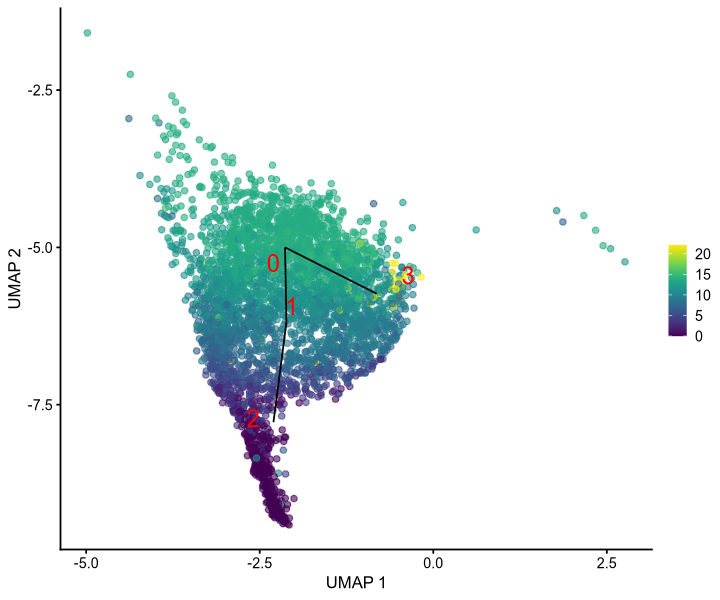

In [185]:
common.pseudo <- averagePseudotime(tscan.pseudo) 
homo_traj = plotUMAP(just.sym.sce, colour_by=I(common.pseudo), 
        text_by="label", text_colour="red") +
    geom_line(data=line.data, mapping=aes(x=umap_1, y=umap_2, group=edge))
homo_traj

-------------------------------------

In [188]:
hemi_subset = subset(
    hemi, 
    subset = annot %in% chr
)

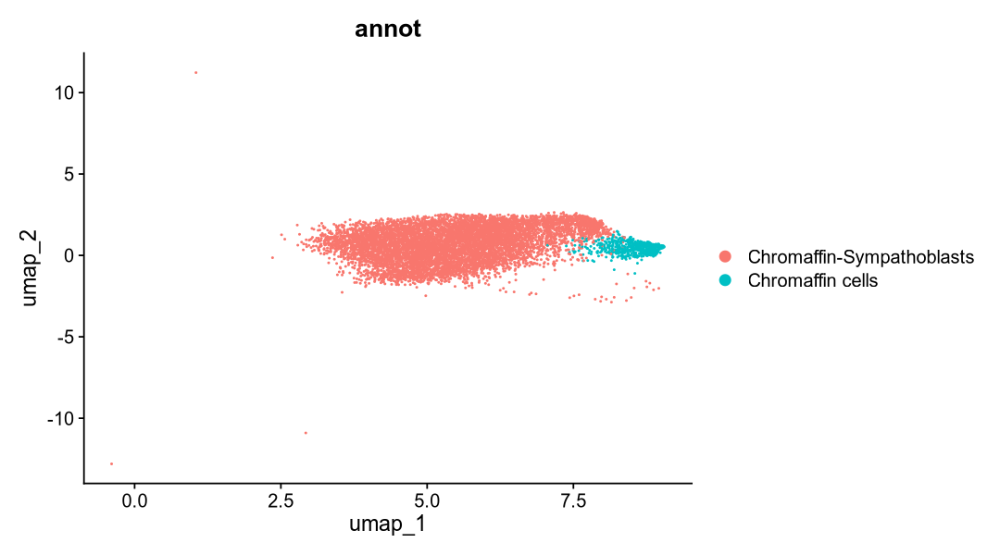

In [189]:
fig.size(5,9)
DimPlot(hemi_subset, group.by='annot')

In [193]:
hemi_subset = hemi_subset[,Embeddings(hemi_subset, reduction = 'umap') %>% data.frame %>%
    filter((umap_1 > 2) & ((umap_2 > -10) & (umap_2 < 10))) %>% rownames]

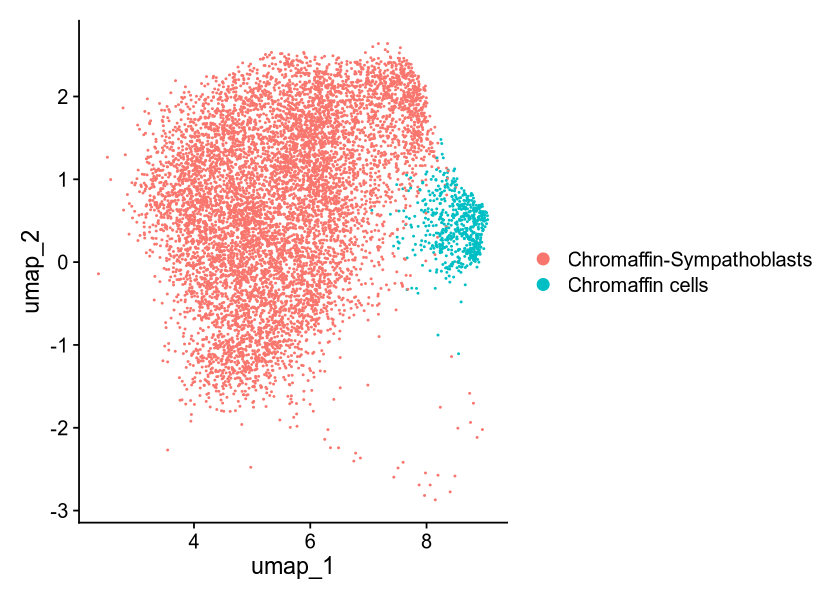

In [216]:
fig.size(5,7)
hemidim = hemi_subset[,Embeddings(hemi_subset, reduction = 'umap') %>% data.frame %>%
    filter((umap_1 > 2) & ((umap_2 > -10) & (umap_2 < 10))) %>% rownames] %>% DimPlot
hemidim
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/FigureR1C-Hemizygous_subset_umap.pdf'),
    plot =hemidim, 
    height = 5,
    width = 7,
    create.dir=TRUE
      )

In [194]:
seurat_subset = hemi_subset

In [195]:
DefaultAssay(seurat_subset) = 'integrated'
seurat_subset <- FindNeighbors(seurat_subset, dims = 1:10)
seurat_subset = FindClusters(seurat_subset, resolution=0.2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 8725
Number of edges: 282159

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8798
Number of communities: 4
Elapsed time: 0 seconds


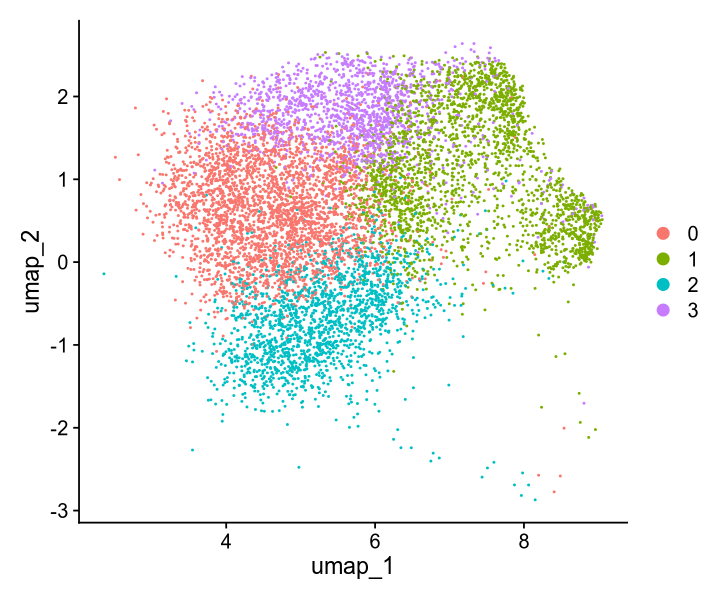

In [197]:
fig.size(5,6)
DimPlot(seurat_subset)

In [203]:
just.sym.sce <- as.SingleCellExperiment(seurat_subset, assay = "RNA")

In [204]:
colLabels(just.sym.sce) = factor(seurat_subset$seurat_clusters)
by.cluster <- aggregateAcrossCells(just.sym.sce, ids=colLabels(just.sym.sce))
centroids <- reducedDim(by.cluster, "PCA")
mst <- createClusterMST(centroids, clusters=NULL)
mst

IGRAPH 29659a1 UNW- 4 3 -- 
+ attr: name (v/c), coordinates (v/x), weight (e/n), gain (e/n)
+ edges from 29659a1 (vertex names):
[1] 0--2 0--3 1--3

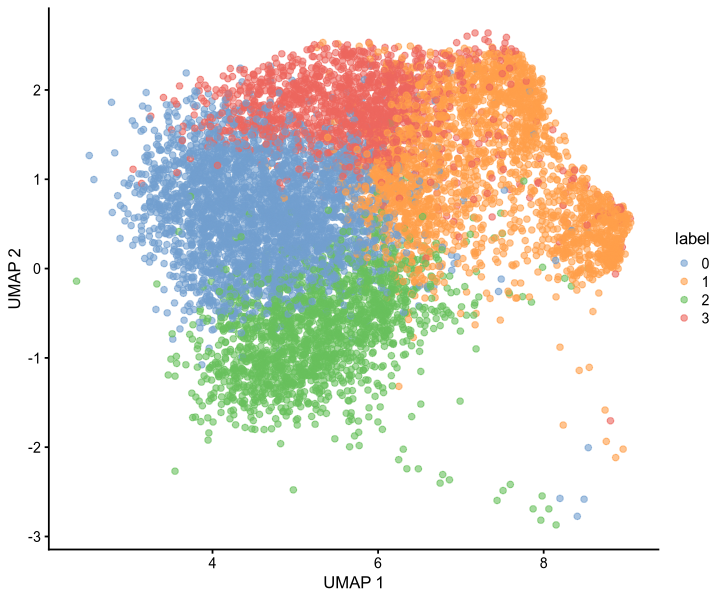

In [205]:
fig.size(5,6)
plotUMAP(just.sym.sce, colour_by="label")


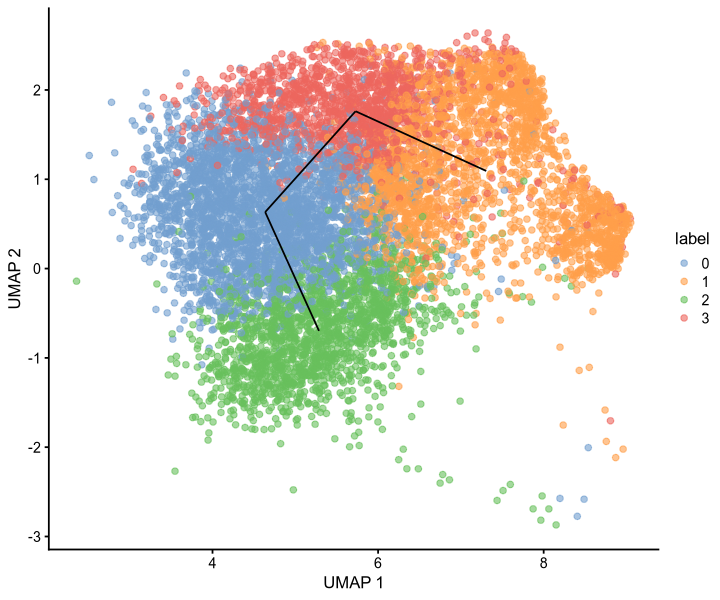

In [207]:
line.data <- reportEdges(by.cluster, mst=mst, clusters=NULL, use.dimred="UMAP")
plotUMAP(just.sym.sce, colour_by="label") + 
    geom_line(data=line.data, mapping=aes(x=umap_1, y=umap_2, group=edge))


In [208]:
map.tscan <- mapCellsToEdges(just.sym.sce, mst=mst, use.dimred="PCA")
tscan.pseudo <- orderCells(map.tscan, mst)
head(tscan.pseudo)

class: PseudotimeOrdering 
dim: 6 1 
metadata(1): start
pathStats(1): ''
cellnames(6): het1_tumor_AAACCCATCGCTGTCT-1_1
  het1_tumor_AAACGCTTCTACCCAC-1_1 ... het1_tumor_AAAGGTAAGCAGCAGT-1_1
  het1_tumor_AAAGTCCTCCCGAGGT-1_1
cellData names(4): left.cluster right.cluster left.distance
  right.distance
pathnames(1): 2
pathData names(0):

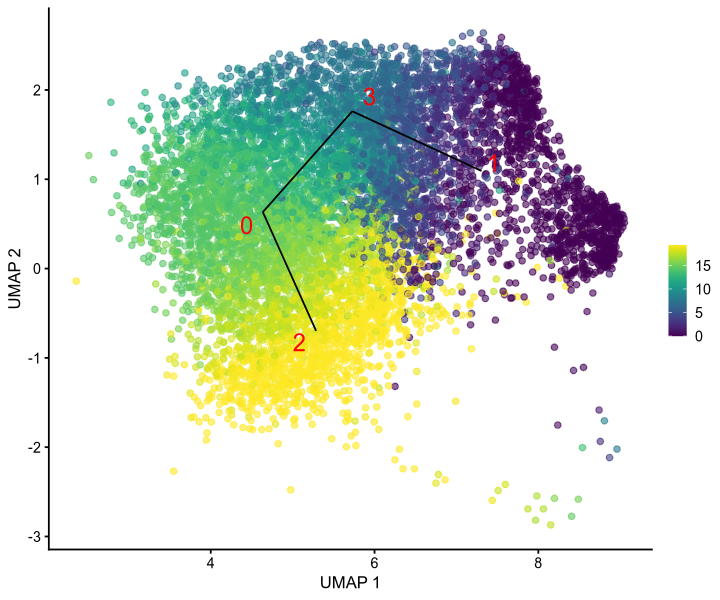

In [209]:
common.pseudo <- averagePseudotime(tscan.pseudo) 
hemi_traj = plotUMAP(just.sym.sce, colour_by=I(common.pseudo), 
        text_by="label", text_colour="red") +
    geom_line(data=line.data, mapping=aes(x=umap_1, y=umap_2, group=edge))
hemi_traj

In [210]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/FigureR1C-Hemizygous_subset_trajectory.pdf'),
    plot =hemi_traj, 
    height = 5,
    width = 7,
    create.dir=TRUE
      )

In [245]:
library(SeuratData)
library(SeuratDisk)

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat



In [247]:
SaveH5Seurat(homo, 
             filename =glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_homo.h5seurat'
        )
    )


Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Adding data for integrated

Adding scale.data for integrated

Adding variable features for integrated

No feature-level metadata found for integrated

Adding cell embeddings for pca

Adding loadings for pca

No projected loadings for pca

Adding standard deviations for pca

No JackStraw data for pca

Adding cell embeddings for umap

No loadings for umap

No projected loadings for umap

No standard deviations for umap

No JackStraw data for umap



In [248]:
Convert(
   glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_homo.h5seurat'
        ), 
dest = "h5ad")

Validating h5Seurat file

Adding data from RNA as X

Adding counts from RNA as raw

Transfering meta.data to obs

Adding dimensional reduction information for umap (global)



In [254]:
homo

An object of class Seurat 
33411 features across 41430 samples within 2 assays 
Active assay: RNA (31411 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [251]:
DefaultAssay(hemi) = "RNA"

In [255]:
hemi

An object of class Seurat 
33411 features across 57868 samples within 2 assays 
Active assay: RNA (31411 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [257]:
hemi[["RNA"]] = as(object = hemi[["RNA"]], Class="Assay")

Warning message:
“Assay RNA changing from Assay5 to Assay”


In [258]:
SaveH5Seurat(hemi, 
             overwrite=T,
             filename =glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.h5seurat'
        )
    )


Warning message:
“Overwriting previous file /scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.h5seurat”
Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

Adding scale.data for RNA

Adding variable features for RNA

Adding feature-level metadata for RNA

Adding data for integrated

Adding scale.data for integrated

Adding variable features for integrated

No feature-level metadata found for integrated

Adding cell embeddings for pca

Adding loadings for pca

No projected loadings for pca

Adding standard deviations for pca

No JackStraw data for pca

Adding cell embeddings for umap

No loadings for umap

No projected loadings for umap

No standard deviations for umap

No JackStraw data for umap



In [250]:
Convert(
   glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_hemi.h5seurat'
        ), 
dest = "h5ad")

Validating h5Seurat file

Adding data from RNA as X



ERROR: Error in assay.group$obj_copy_to(dst_loc = dfile, dst_name = "X", src_name = x.data): HDF5-API Errors:
    error #000: ../../src/H5Ocopy.c in H5Ocopy(): line 233: unable to copy object
        class: HDF5
        major: Object header
        minor: Unable to copy object

    error #001: ../../src/H5Ocopy.c in H5O__copy(): line 286: source object not found
        class: HDF5
        major: Symbol table
        minor: Object not found

    error #002: ../../src/H5Gloc.c in H5G_loc_find(): line 422: can't find object
        class: HDF5
        major: Symbol table
        minor: Object not found

    error #003: ../../src/H5Gtraverse.c in H5G_traverse(): line 851: internal path traversal failed
        class: HDF5
        major: Symbol table
        minor: Object not found

    error #004: ../../src/H5Gtraverse.c in H5G__traverse_real(): line 627: traversal operator failed
        class: HDF5
        major: Symbol table
        minor: Callback failed

    error #005: ../../src/H5Gloc.c in H5G__loc_find_cb(): line 378: object 'data' doesn't exist
        class: HDF5
     


## Count level statistics

In [260]:
homo

An object of class Seurat 
33411 features across 41430 samples within 2 assays 
Active assay: RNA (31411 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [5]:
library(ggbreak)

ggbreak v0.1.2

If you use ggbreak in published research, please cite the following
paper:

S Xu, M Chen, T Feng, L Zhan, L Zhou, G Yu. Use ggbreak to effectively
utilize plotting space to deal with large datasets and outliers.
Frontiers in Genetics. 2021, 12:774846. doi: 10.3389/fgene.2021.774846




In [12]:
get_stat = function(seurat_obj){
    metadata <- seurat_obj@meta.data
      # Adjust based on your Seurat object metadata
    # Calculate total cell numbers per sample
    
    cell_counts_per_sample <- table(metadata$orig.ident)
    
    # Calculate total cell numbers per cell population (assuming cell type annotations are in 'cell_type' column)
    cell_counts_per_population <- table(metadata$annot)
    
    # Convert tables to data frames for easy plotting
    df_sample_counts <- as.data.frame(cell_counts_per_sample)
    df_population_counts <- as.data.frame(cell_counts_per_population)
    
    # Rename columns for clarity
    colnames(df_sample_counts) <- c("Sample", "Cell_Count")
    colnames(df_population_counts) <- c("Cell_Type", "Cell_Count")
    return (df_sample_counts)
}

In [7]:
get_stat_plot = function(seurat_obj,color.list, breaks = FALSE){
    
    
    metadata <- seurat_obj@meta.data
      # Adjust based on your Seurat object metadata
    # Calculate total cell numbers per sample
    
    cell_counts_per_sample <- table(metadata$orig.ident)
    
    # Calculate total cell numbers per cell population (assuming cell type annotations are in 'cell_type' column)
    cell_counts_per_population <- table(metadata$annot)
    
    # Convert tables to data frames for easy plotting
    df_sample_counts <- as.data.frame(cell_counts_per_sample)
    df_population_counts <- as.data.frame(cell_counts_per_population)
    
    # Rename columns for clarity
    colnames(df_sample_counts) <- c("Sample", "Cell_Count")
    colnames(df_population_counts) <- c("Cell_Type", "Cell_Count")

    p1 <- ggplot(df_sample_counts, aes(x = Sample, y = Cell_Count)) +
      geom_bar(stat = "identity", fill = "steelblue") +
      theme_classic(base_size = 14) +
      labs(title = "Cell Counts per Sample", x = "Sample", y = "Number of Cells") +
      theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5,face = "bold"),
            axis.text.y = element_text(face = "bold"),
            axis.title = element_text(face = "bold"),
            plot.title = element_text(face = "bold", size = 16, hjust = 0.5),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            axis.line = element_line(size = 0.5)) +
      scale_y_continuous(expand = expansion(mult = c(0, 0.05)))
    
    # Plot cell counts per cell population
    if(breaks){
        p2 <- ggplot(df_population_counts, aes(x = Cell_Type, y = Cell_Count, fill = Cell_Type)) +
          geom_bar(stat = "identity") +
          theme_classic(base_size = 14) +  # Use a classic theme with larger base font size
          labs(title = "Cell Counts per Cell Population", x = "Cell Type", y = "Number of Cells") +
          theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, face = "bold"),
                axis.text.y = element_text(face = "bold"),
                axis.title = element_text(face = "bold"),
                plot.title = element_text(face = "bold", size = 16, hjust = 0.5),
                panel.grid.major = element_blank(),
                panel.grid.minor = element_blank(),
                axis.line = element_line(size = 0.5),
               legend.position = "none") +
          scale_y_continuous(expand = expansion(mult = c(0, 0.05))) +
          scale_fill_manual(values = color.list)+
          scale_y_break(c(7000, 20000)) 
    }else{
        p2 <- ggplot(df_population_counts, aes(x = Cell_Type, y = Cell_Count, fill = Cell_Type)) +
          geom_bar(stat = "identity") +
          theme_classic(base_size = 14) +  # Use a classic theme with larger base font size
          labs(title = "Cell Counts per Cell Population", x = "Cell Type", y = "Number of Cells") +
          theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, face = "bold"),
                axis.text.y = element_text(face = "bold"),
                axis.title = element_text(face = "bold"),
                plot.title = element_text(face = "bold", size = 16, hjust = 0.5),
                panel.grid.major = element_blank(),
                panel.grid.minor = element_blank(),
                axis.line = element_line(size = 0.5),
               legend.position = "none") +
          scale_y_continuous(expand = expansion(mult = c(0, 0.05))) +
          scale_fill_manual(values = color.list) 
    }

    umi_counts_per_sample <- aggregate(colSums(seurat_obj@assays$RNA@counts), 
                                   by = list(Sample = metadata$orig.ident), 
                                   FUN = sum)
    names(umi_counts_per_sample)[2] <- "UMI_Count"
    
    # Calculate the total gene counts per sample (orig.ident)
    gene_counts_per_sample <- aggregate(colSums(seurat_obj@assays$RNA@counts > 0), 
                                        by = list(Sample = metadata$orig.ident), 
                                        FUN = sum)
    names(gene_counts_per_sample)[2] <- "Gene_Count"
    
    # Merge UMI counts and gene counts into a single data frame
    df_depth <- merge(umi_counts_per_sample, gene_counts_per_sample, by = "Sample")
    
    # Plot UMI counts per sample with enhanced theme
    p3 <- ggplot(df_depth, aes(x = Sample, y = UMI_Count)) +
      geom_bar(stat = "identity", fill = "steelblue") +
      theme_classic(base_size = 14) +
      labs(title = "UMI Counts per Sample", x = "Sample", y = "Total UMI Count") +
      theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5,face = "bold"),
            axis.text.y = element_text(face = "bold"),
            axis.title = element_text(face = "bold"),
            plot.title = element_text(face = "bold", size = 16, hjust = 0.5),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            axis.line = element_line(size = 0.5)) +
      scale_y_continuous(expand = expansion(mult = c(0, 0.05)))
    
    # Display the plot
    #print(p3)
    
    # Plot gene counts per sample with enhanced theme
    p4 <- ggplot(df_depth, aes(x = Sample, y = Gene_Count)) +
      geom_bar(stat = "identity", fill = "steelblue") +
      theme_classic(base_size = 14) +
      labs(title = "Gene Counts per Sample", x = "Sample", y = "Total Gene Count") +
      theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5,face = "bold"),
            axis.text.y = element_text(face = "bold"),
            axis.title = element_text(face = "bold"),
            plot.title = element_text(face = "bold", size = 16, hjust = 0.5),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            axis.line = element_line(size = 0.5)) +
      scale_y_continuous(expand = expansion(mult = c(0, 0.05)))
    
    # Display the plot
    plots = (p1 | p2) / (p3 | p4)
    plots
    return(plots)
}

In [15]:
homo.df = get_stat(homo)
hemi.df = get_stat(hemi)

In [16]:
rbind(homo.df, hemi.df)

Sample,Cell_Count
<fct>,<int>
homo1,6860
homo2,4058
homo3,11725
no_50_PT,8314
no_6_PT,10473
het1,12856
het2,6833
het3,12546
het4,13317


In [17]:
12546 + 13317 + 12316


[1] 38179

In [306]:
color.list = ggthemes::tableau_color_pal('Tableau 20')(20)[1:15]
#color.list = hue_pal()(15)
names(color.list) = homo$annot %>% unique

In [308]:
fig.size(10,10)
plots = get_stat_plot(homo, color.list)

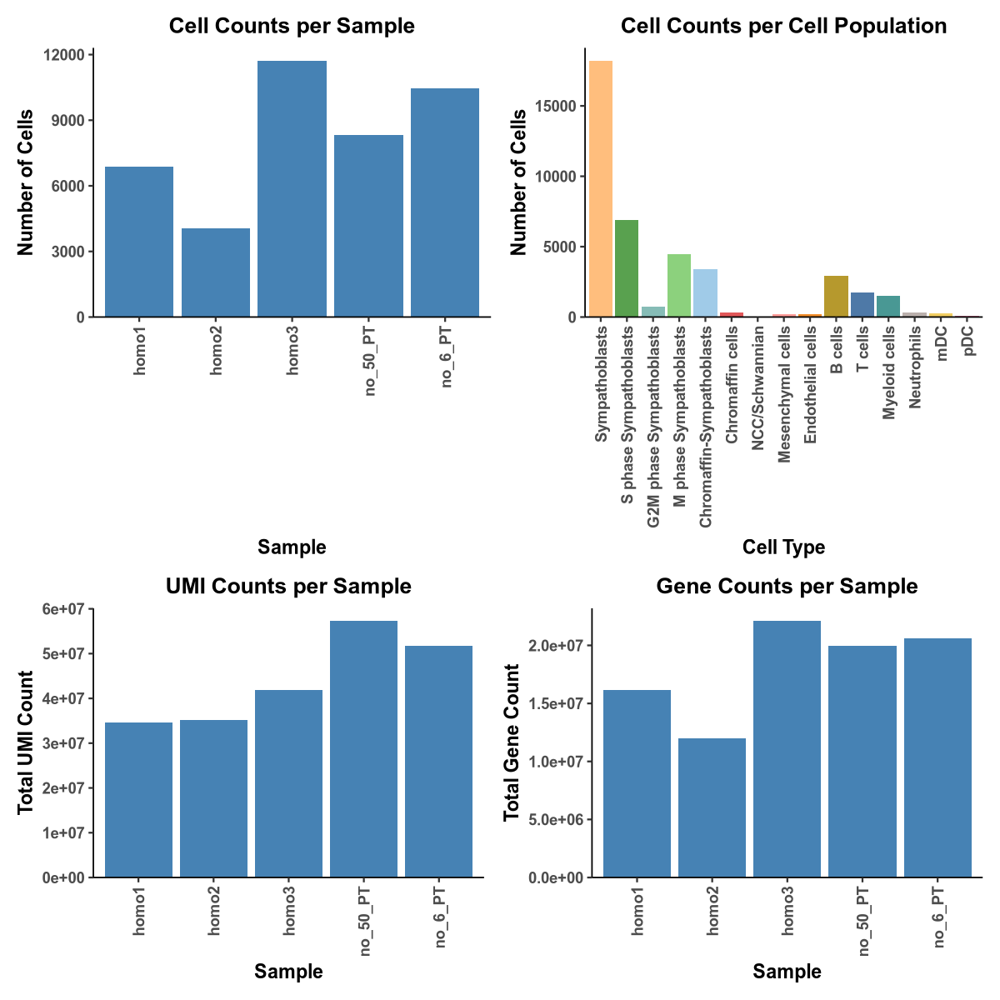

In [309]:
plots

In [310]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R3_A_homo.pdf'),
    plot= plots, 
    height = 15,
    width = 15,
    create.dir=TRUE
      )

In [311]:
fig.size(10,10)
plots = get_stat(hemi,color.list)

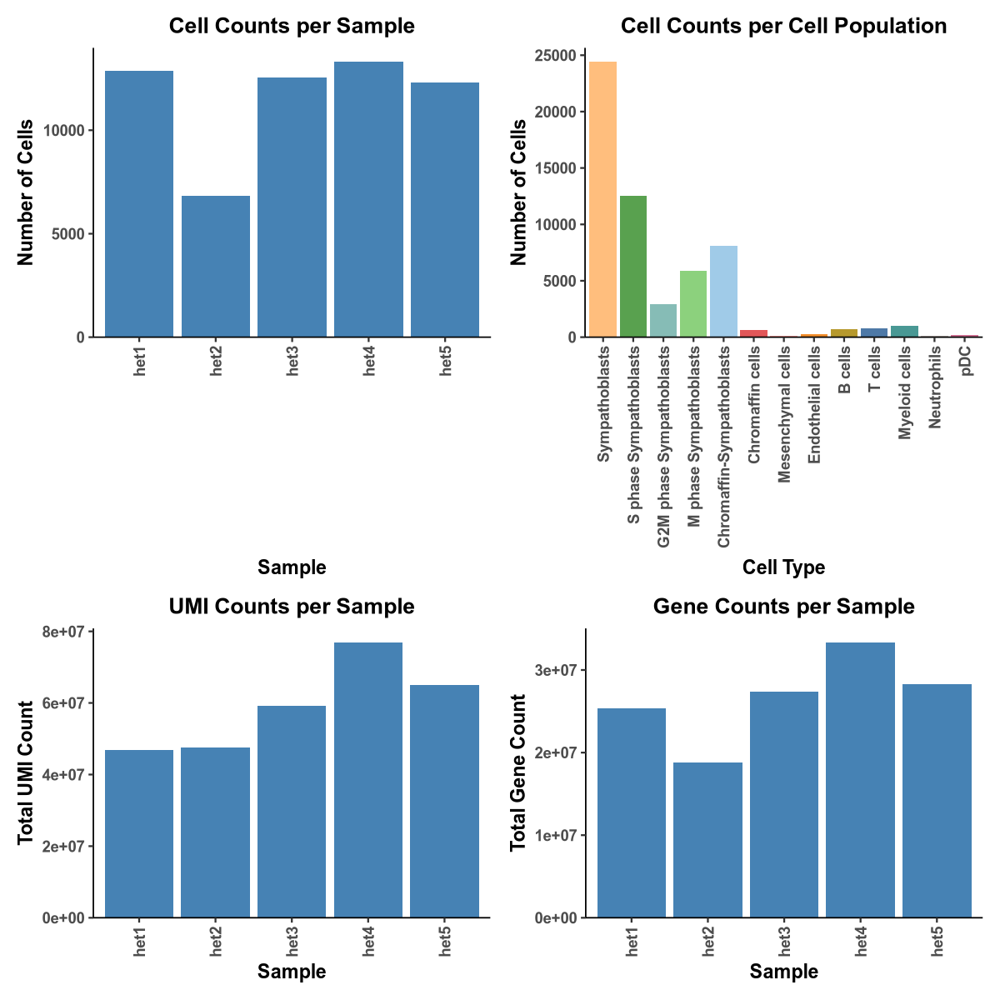

In [312]:
plots

In [313]:
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_3/Figure_R3_A_hemi.pdf'),
    plot= plots, 
    height = 15,
    width = 15,
    create.dir=TRUE
      )

In [320]:
genes <- c("MYCN", "Phox2b", "Nefl", "Th", "Rrm2", "Mki67", "Top2a", "Cdc20", "Th", "Cartpt")


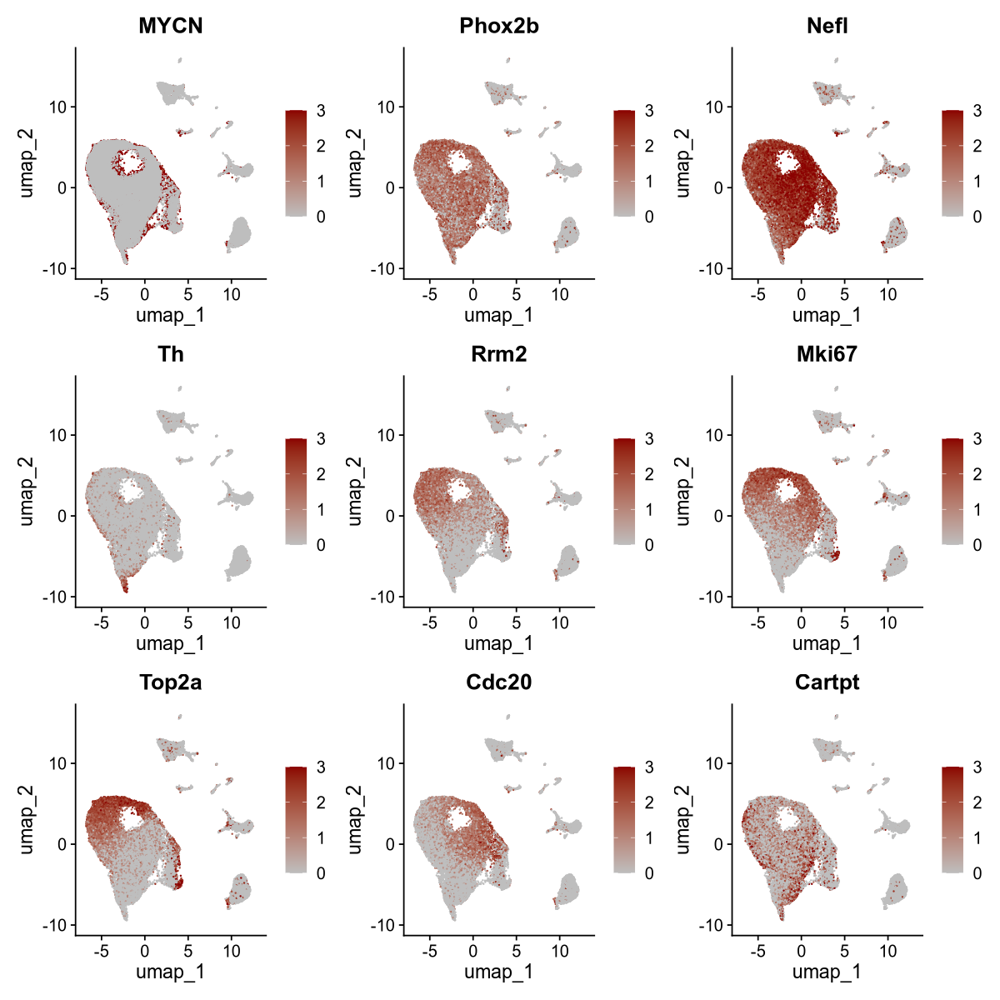

In [336]:
fig.size(10,10)
feat_plot = FeaturePlot(
    homo, 
    reduction = "umap",
    cols = c("grey", "darkred"),
    min.cutoff = 0,
    max.cutoff = 3,
    features = genes)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/Figure1D_Featureplot_5-Homozygous_Samples.pdf'),
    plot =feat_plot, 
    height = 10,
    width = 10,
    create.dir=TRUE
      )
feat_plot

In [ ]:
feat_plot = FeaturePlot(
    hemi, 
    reduction = "umap",
    cols = c("grey", "darkred"),
    min.cutoff = 0,
    max.cutoff = 3,
    features = genes)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/Figure1D_Featureplot_5-Hemizygous_Samples.pdf'),
    plot =feat_plot, 
    height = 10,
    width = 10,
    create.dir=TRUE
      )
feat_plot

In [324]:
other_genes <- c("MYCN", "Prrx1", "Mgp", "Sox10", "Erbb3", "Cd24", "Phox2b")

Warning message:
“The following features were omitted as they were not found:
ℹ Cd24”


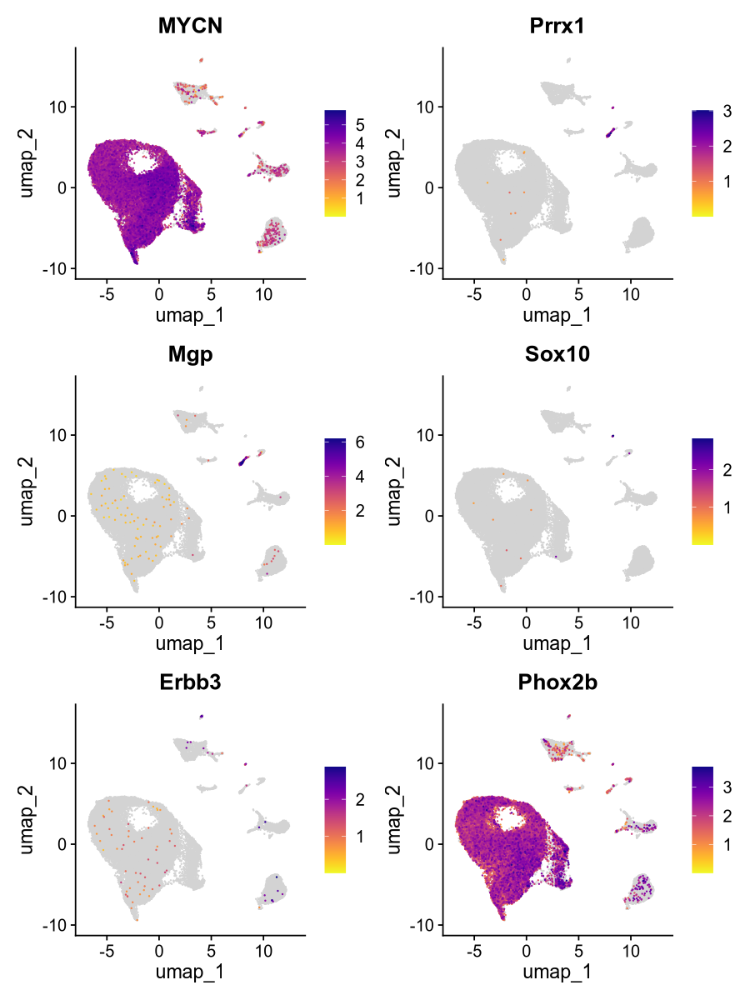

In [327]:
fig.size(10,7.5)
feat_plot = FeaturePlot_scCustom(
    homo, 
    reduction = "umap", 
    features = other_genes)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_S3/FigureS3B_Featureplot_5-Homozygous_Samples.pdf'),
    plot =feat_plot, 
    height = 10,
    width = 7.5,
    create.dir=TRUE
      )
feat_plot

Warning message:
“The following features were omitted as they were not found:
ℹ Cd24”


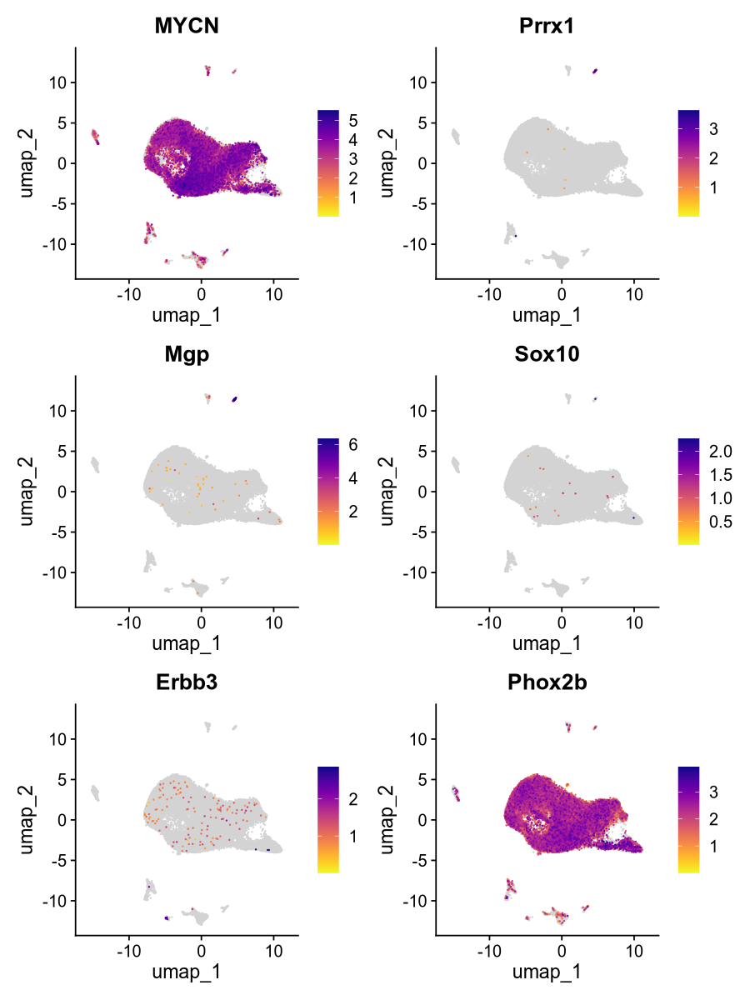

In [328]:
fig.size(10,7.5)
feat_plot = FeaturePlot_scCustom(
    hemi, 
    reduction = "umap", 
    features = other_genes)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_S3/FigureS3B_Featureplot_5-Hemizygous_Samples.pdf'),
    plot =feat_plot, 
    height = 10,
    width = 7.5,
    create.dir=TRUE
      )
feat_plot